# Zaawansowane przetwarzanie obrazu w systemach autonomicznych

## Ćwiczenie laboratoryjne 3 – Bag of Visual Words




## Wstęp teoretyczny

### Zadanie 1: 

Uzupełnij zdanie: "Na każdych zajęciach obowiązuje..." 

(poprawna odpowiedź znajduje się komórce niżej – ale proszę ją sprawdzić dopiero po przygotowaniu własnego rozwiązania).

### Odpowiedź

"...znajomość materiału zaprezentowanego na wykładzie".


W szczególności dobrze było by sobie powtórzyć/przejrzeć (a jeszcze lepiej – zrozumieć) związaną z dzisiejszym tematem końcówkę wykładu nr. 1, (od slajdu 109).


Dodatkowo, bardzo przydatny może być Notebook z poprzednich laboratoriów – część czynności które będziemy musieli wykonać pokrywa się z przedstawionymi tam konceptami.

Jak można było wywnioskować z tytułu, tematem aktualnych zajęć będzie wykorzystanie modelu Bag of Words. Wywodzi się on z NLP (przetwarzania języka naturalnego) i służy do (uproszczenia) reprezentacji danych poprzez przedstawienie ich jako częstość (histogram) występowania poszczególnych słów (ograniczonych przez pewien wcześniej stworzony słownik).

W przypadku przetwarzania obrazów, rolę słów "lądujących w worku" pełnią cechy wyodrębnione z obrazu – zazwyczaj poprzez znane i sprawdzone "tradycyjne" detektory/deskryptory (jak SURF czy AKAZE).

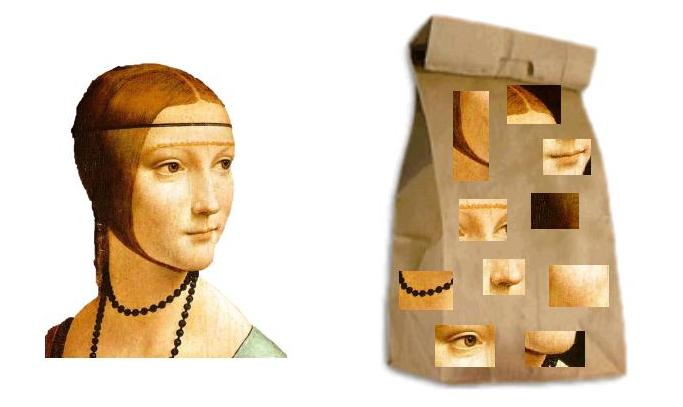


Samo Bag of (Visual) Words jest jednak tylko modelem reprezentacji/transformacji oryginalnych danych – które są później wykorzystywane przez docelowe algorytmy klasyfikacji/regresji uczenia maszynowego (jak te, które poznaliśmy na zajęciach wcześniejszych).

## Zbiór danych

Machine learning bez danych jest zdecydowanie utrudniony – dlatego zacznijmy od zaopatrzenia się w nie.

Na dysku google pod poniższym linkiem znajduje się dataset z którym będziemy pracować: https://drive.google.com/open?id=11VixPvHH60lPtEPKrWkkRe0YXewRGoUv.

Zawiera on dwie klasy zdjęć: okręty typu żaglówka (dobre na relaksujące rodzinne wycieczki) i okręty wojenne (jeszcze lepsze na relaksujące rodzinne wycieczki).
Poniżej można zobaczyć próbki z obu wymienionych:

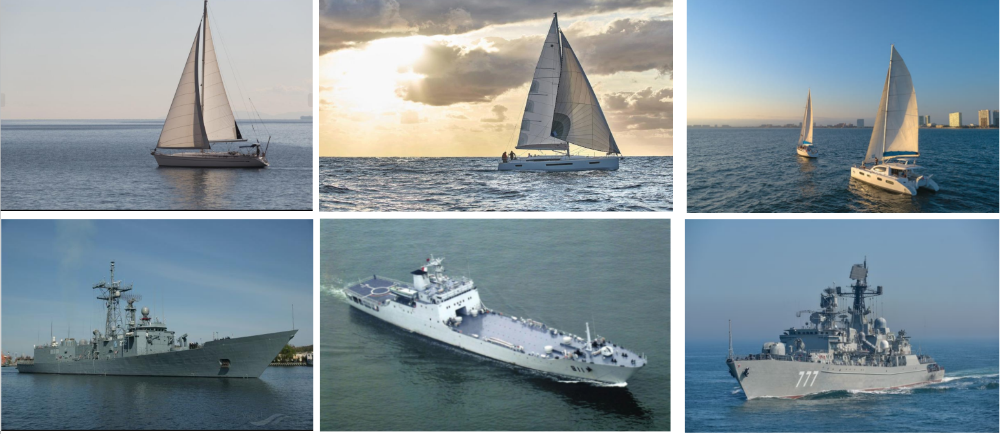

<b>TODO 4YOU</b>

Widoczna w komórce wyżej próbka jest tylko częścią zdjęć z naszych dostępnych danych – zadbaj o to, żebyś mogła/mógł przeglądać je wszystkie w notebooku w którym aktualnie pracujesz podczas wieczorów w kwarantannie.

Pobierz dane ze wskazanej lokalizacji, a następnie umieść je na własnym gdrivie i "podłącz/pobierz" je do sesji w Colabie (nie dotyczy tych, którzy pracują w środowisku lokalnym). Następnie wczytaj wszystkie dostępne zdjęcia do pamięci, jednocześnie tworząc odpowiedni wektor, w którym zakodowane będą w postaci liczb całkowitych klasy odpowiadające poszczególnym próbkom (na późniejsze potrzeby). Wyświetl parę (można wszystkie, nie ma ich aż tak dużo) przykładów zdjęć dla obu klas.


In [ ]:
from google.colab import drive

drive.mount('/content/drive')

In [ ]:
from matplotlib import pyplot as plt
from typing import Tuple

import pickle
import os
import json

import numpy as np
import cv2
from google.colab.patches import cv2_imshow
def load_dataset(dataset_dir_path: str) -> Tuple[np.ndarray, np.ndarray]:
    width = 768
    x, y = [], []
    for i, class_dir in enumerate(sorted(os.listdir(dataset_dir_path))):  # Sortowanie klas alfabetycznie
        class_dir_path = os.path.join(dataset_dir_path, class_dir)
        for file in os.listdir(class_dir_path):
            img_file = cv2.imread(os.path.join(class_dir_path, file), cv2.IMREAD_GRAYSCALE)
            #img_file = cv2.medianBlur(img_file,3)
            high = int(img_file.shape[0]*width/img_file.shape[1])
            if width < img_file.shape[1] and high < img_file.shape[0]:
              img_file = cv2.resize(img_file, (width, high))
            x.append(img_file)
            y.append(i)
    return np.asarray(x), np.asarray(y)

!ls /content/drive/My\ Drive/dataset_2/train
X, y = load_dataset('/content/drive/My Drive/dataset_2/train') #load_dataset('/content/drive/My Drive/test/dataset3')

X_data, y_data = load_dataset('/content/drive/My Drive/projekt1/test')

baltyk	katedra  okraglak  teatr_wielki  uam


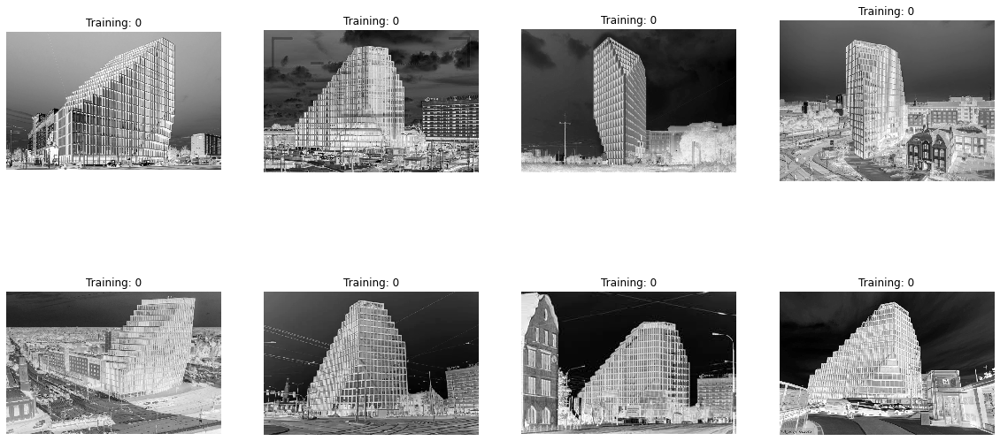

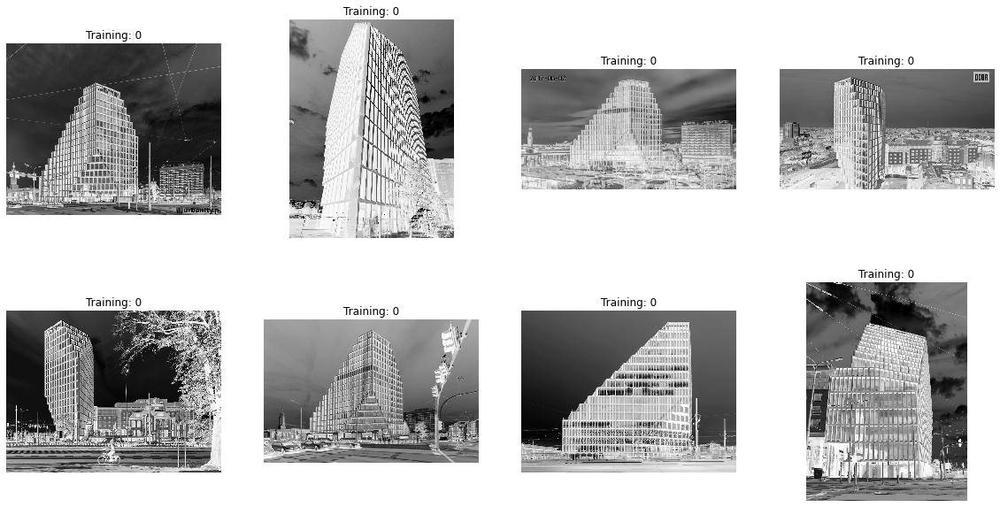

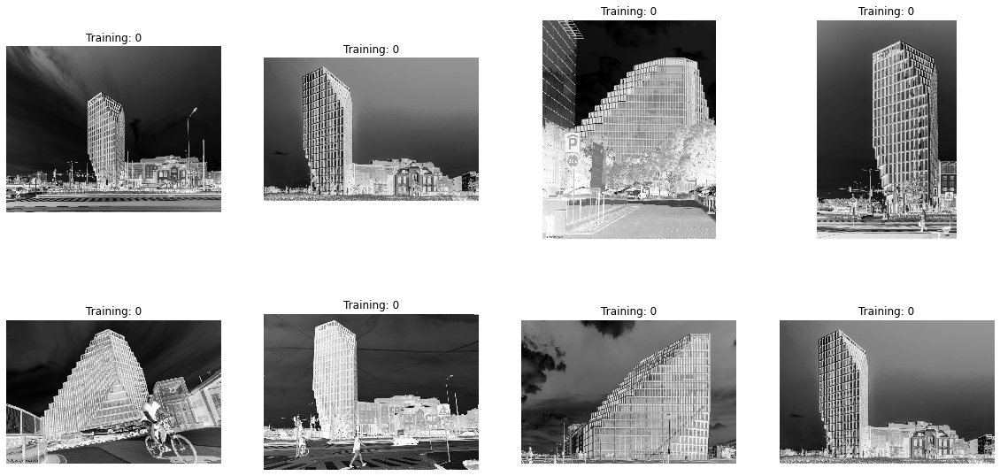

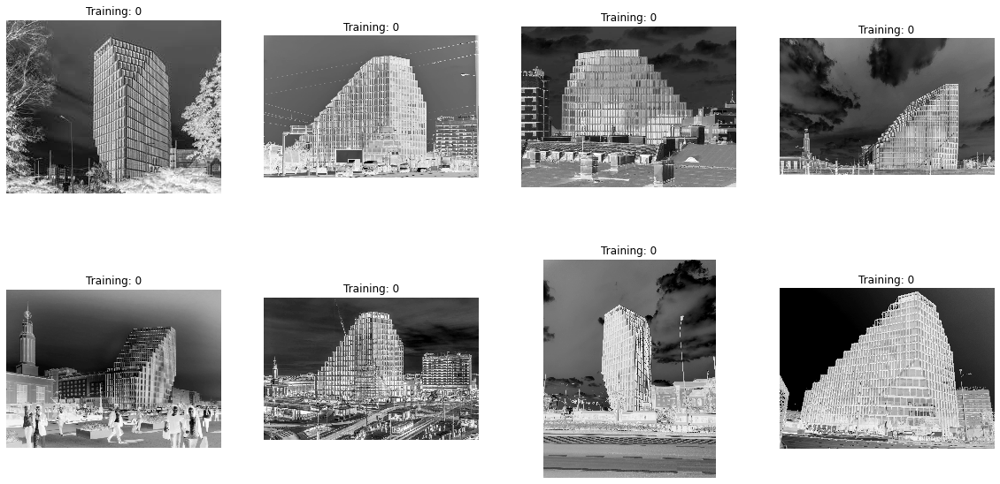

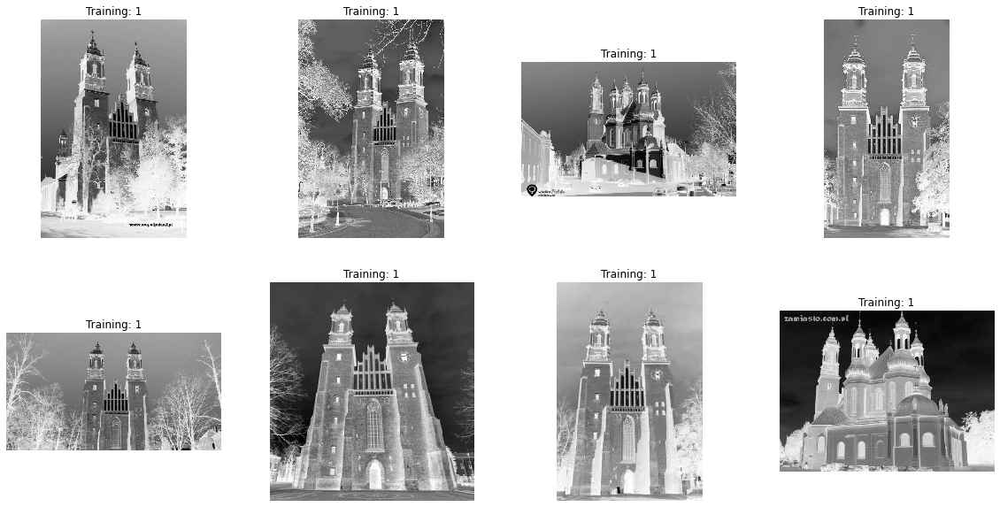

...

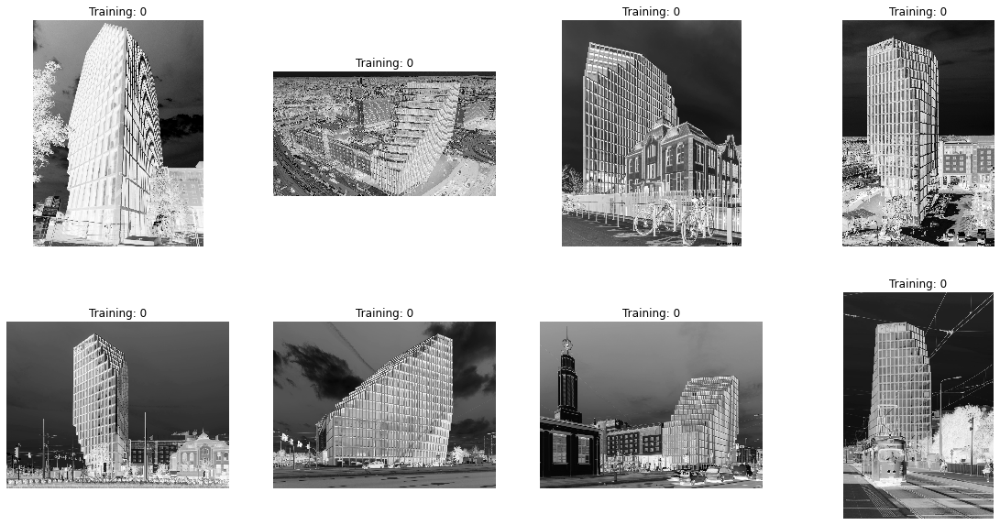

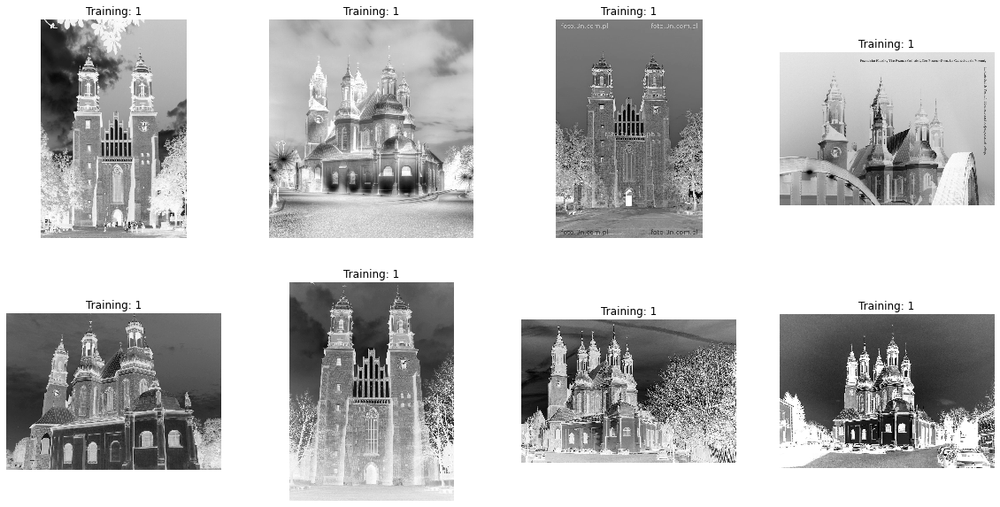

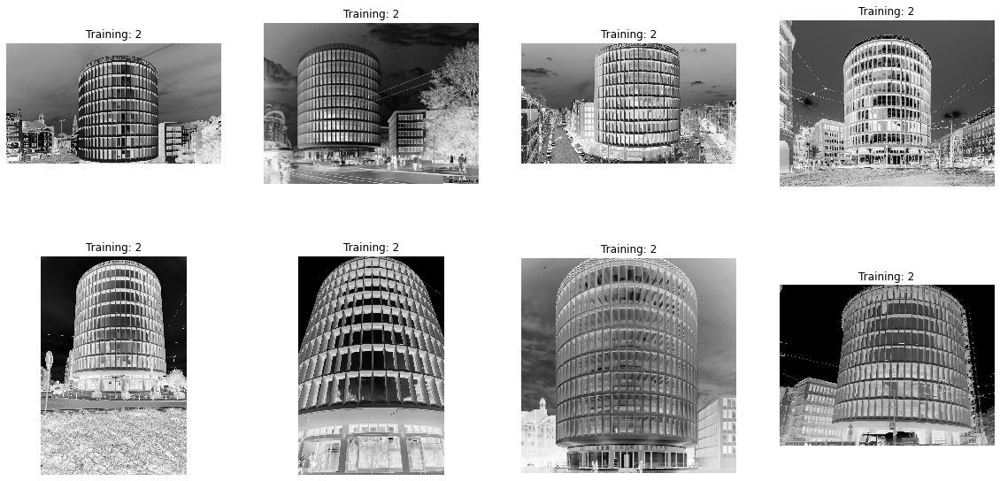

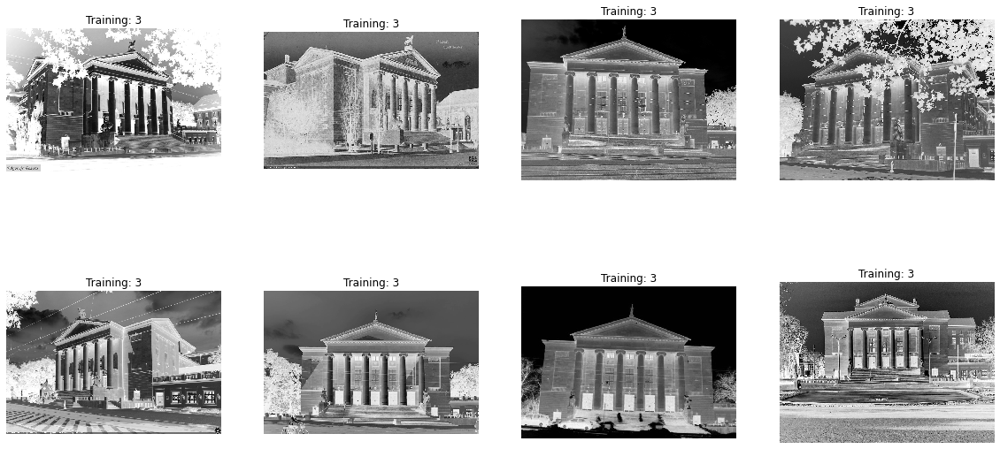

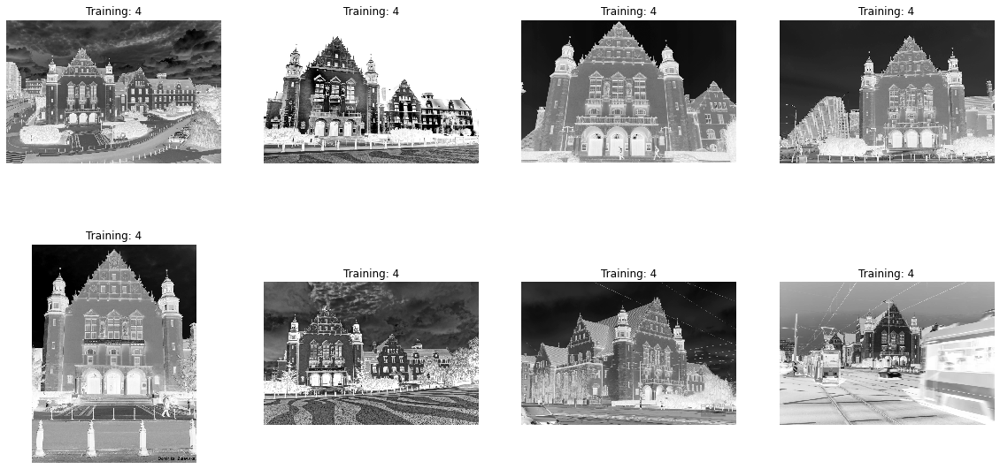

In [ ]:
#Wyświetlanie
#rows = np.ceil(len(y)/4)
def print_img(X: np.ndarray, y: np.ndarray):
    images_and_labels = list(zip(X, y))
    for epoch in range(int(np.ceil(len(y)/8))):
        plt.figure(figsize=(20,10))
        for index, (image, label) in enumerate(images_and_labels[(epoch*8):(epoch*8+8)]):
            plt.subplot(2 , 4, index + 1)
            plt.axis('off')
            plt.imshow(image, cmap=plt.cm.gray_r, interpolation='nearest')
            #plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap=plt.cm.gray_r, interpolation='nearest')
            plt.title('Training: %i' % label)
    plt.show()
print_img(X, y)
print_img(X_data, y_data)


## Przygotowanie "słownika"

W ogólności, nam jako ludziom nie sprawia problemu rozróżnienie pomiędzy tymi dwiema klasami. Napisanie abstrakcyjnego kodu, który pozwolił by go w teorii rozwiązać też jest w naszych możliwościach:


```
if żagle in image and len(statek.dziala) == 0:
    is_zaglowka = 'yup'
else:
    is_zaglowka = 'nope'
```

Zdecydowanie gorzej natomiast było by ze szczegółową implementacją – jak określić czy na obrazie jest żagiel? Porównywać wartości różnych pixeli? Jeśli tak to jakich konkretnie, co z faktem, że żagiel może być w różnych miejscach obrazu, etc, etc. Generalnie zadanie to zdecydowanie lepiej oddelegować metodom automatycznym – np. znanym nam już z wykładów detektorom/deskryptorom cech obrazowych.



Opencv zawiera w sobie implementacje wielu "tradycyjnych" detektorów/deskryptorów cech. Aby z nich skorzystać, wystarczy utowrzyć odpowiedni obiekt:

In [ ]:
import cv2

feature_detector_descriptor = cv2.AKAZE_create()

Wszystkie detektory/deskryptory w opencv mają wspólne, wysokopoziomowe API. Do ich tworzenia służą fukcje w schemacie takim jak ta przedstawiona powyżej:
<b>cv2.X_create()</b>, gdzie za <b>X</b> podstawiamy nazwę detektora/deskryptora który nas interesuje, np. ORB czy AKAZE.

Aby obliczyć deskryptor wczytanego wcześniej obrazu, można się posłużyć następującą metodą:

In [ ]:
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
from skimage import data

image = data.astronaut()[:,:, ::-1]


keypoints, image_descriptor = feature_detector_descriptor.detectAndCompute(image, None) 
#cv2_imshow(image)
# Drugim argumentem może być maska binarna, która służy do zawężenia obszaru z którego
# uzyskujemy punkty kluczowe/deskryptor – jako, że nam akurat zależy na całym obrazie,
# podaliśmy tam wartość None.

In [ ]:
# Wynikiem jest lista punktów kluczowych oraz odpowiadającym im wektorów – które składają się na deskryptor.
len(keypoints), len(image_descriptor)

(870, 870)

In [ ]:
keypoints[0]

<KeyPoint 0x7fc51ed7bc00>

In [ ]:
[attr for attr in dir(keypoints[0]) if not attr.startswith('__')]

['angle', 'class_id', 'convert', 'octave', 'overlap', 'pt', 'response', 'size']

In [ ]:
image_descriptor[0]

array([160,   6,   2,  24,  14,   0,  56, 249,  61,   7, 254,   0,   0,
       136,  63,   0,   6, 128,   1, 112,   6, 255,   0,   0,   0,  24,
        56,  28,   0,   0,  31,  34, 132, 184,  87, 255, 245,  15, 128,
       255, 221, 255,   3, 122, 255,  37,   0,   0,   0, 224,   0,  14,
       115, 252,   1,   2,   0, 252, 255,  63,   0], dtype=uint8)

To właśnie z takich wektorów, opisujących cechy obrazowe chcemy stworzyć nasz 
słownik. Zanim przejdziemy jednak to jego właściwego tworzenia – podzielmy jeszcze dane na odpowiednie podzbiory.

<b>TODO4YOU</b>

Podziel dane "zgodnie ze sztuką" tj. na zbiór treningowy/walidacyjny/testowy.
Pamiętaj o odpowiednich proporcjach (sugerowana dystrybucja to 60%/20%/20%). 


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.25,  random_state=42, shuffle=True, stratify=y)
X_test2, y_test2 = X_data, y_data

Podobnie jak w przypadku wcześniej omawianych "transformatorów" danych (e.g. StandardScaler, MinMaxScaler) – "słownik" naszego BoVW będziemy przygotowywać korzystając tylko ze zbioru treningowego, natomiast sama jego "aplikacja"/przeprowadzanie transformacji dotyczyć będzie już wszystkich zbiorów.

W związku z tym, że pracujemy na danych obrazowych i cechach z nich wyekstrahowanych, musimy mieć na uwadze jeszcze dwa aspekty:
* w przeciwieństwie do języka naturalnego nasz "słownik" cech nie może być słownikiem z idealnym odwzorowaniem 1 do 1 – deskryptory są przecież długimi wektorami, i prefekcyjne dopasowanie jest stosunkowo mało prawdopodobne,
* musimy ograniczyć też w pewien sposób liczbę "słów" – już po przetransformowaniu przykładowego obrazu uzyskaliśmy ich aż 870, a próbek w zbiorze treningowym mamy znacznie więcej.

Oba te problemy można rozwiązać jednym, prostym sposobem (<s>ODKRYŁ JEDEN PROSTY TRIK! NAUKOWCY GO NIENAWIDZĄ! [ZOBACZ JAK!](https://www.youtube.com/watch?v=dQw4w9WgXcQ)</s>) – nie używając konkretnych cech z obrazów ze zbioru treningowego, a raczej ich stworzonego na ich podstawie zgrupowania/klastrów.

<b>TODO4YOU</b>

Na podstawie wcześniej wydzielonego zbioru treningowego, przygotuj nasz "słownik" cech wizyjnych. W tym celu:
* użyj najpierw wybranego wcześniej detektora/deskryptora cech na wszystkich obrazach ze zbioru treningowego, wyodrębniając z niego wszystkie wykryty cechy,
* używając zebranych cech przygotuj/wytrenuj model klastrujący. Skorzystaj z biblioteki sklearn, niech użytym algorytmem będzie KMeans. Zadana jako hiperparametr liczba klastrów odpowiada "pojemności" słownika – ile słów będzie się w nim znajdować. Później będzie można skorzystac z metody <i>predict</i>, aby podając wykryte cechy otrzymać do jakich słów są one przyporządkowane (a w dalszej kolejności również to zliczyć – co jest naszym ostatecznym celem).


In [ ]:
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16

In [ ]:
import cv2
cv2.__version__

'4.1.2'

In [ ]:
from sklearn import cluster
import cv2

NB_WORDS = 150

feature_detector_descriptor = cv2.AKAZE_create()
#feature_detector_descriptor = cv2.xfeatures2d.SIFT_create()
images_features = np.array([]).reshape(0,61)
for i in range(len(y_train)):
  keypoints, image_descriptor = feature_detector_descriptor.detectAndCompute(X_train[i], None)
  images_features = np.concatenate((images_features, image_descriptor))
print(images_features)

[[ 33.  16. 108. ... 121. 255.  62.]
 [ 26.  12. 176. ... 252. 255.  62.]
 [ 10.  29. 144. ...   0. 255.  62.]
 ...
 [ 65. 141. 156. ... 128.  85.  24.]
 [ 33. 124.  14. ... 121. 255.  63.]
 [225. 137. 108. ... 249. 255.  63.]]


In [ ]:
from sklearn.cluster import KMeans

k_means = KMeans(n_clusters = NB_WORDS, random_state=42)
k_means.fit(images_features)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=150, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

In [ ]:
import pickle

#pickle.dump(k_means, open("/content/drive/My Drive/projekt1/vocab_model.p", "wb"))
k_means = pickle.load(open("/content/drive/My Drive/projekt1/vocab_model.p", "rb"))
#print(type(k_means), type(k_means2))



[137 136  99 ... 132  16  67] 0 149


194112

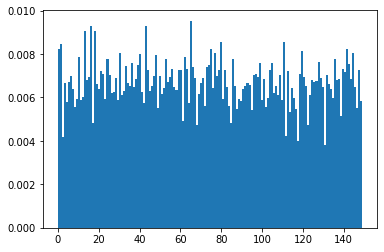

In [ ]:
labels = k_means.predict(images_features)
print(labels, min(labels), max(labels))
#hist = cv2.calcHist([obraz], [1], None, [8], [0,256])
plt.hist(labels,NB_WORDS,[0,(NB_WORDS-1)], density=True)
#plt.show()
len(labels)

## Aplikacja "słownika" – transformacja obrazu do histogramu słów

Mając przygotowany nasz model klastrujący możemy przejść do finalnego etapu transformacji danych – zliczenia poszczególnych słów.

<b>TODO4YOU</b>

Napisz funkcję, która będzie przyjmować dwa argumenty: wyodrębniony z obrazu deskryptor (listę wektorów cech opisujących punkty kluczowe) oraz przygotowany model klastrujący.

Niech przygotowuje ona histogram liczności "słów" w danym deskryptorze. W tym celu powinna ona:
* użyć modelu klastrującego, aby uzyskać informację, do których słów najbardziej pasują dane cechy,
* zliczyć zwrócone przez model liczoności słów, tworząc ich histogram.

<b>Wskazówka</b>: histogram powinien mieć taką samą liczbę kubełków co liczba dostępnych wizualnych słów w naszym wcześniej przygotowanym słowniku.

<b>Wskazówka</b>: Poszczególne obrazy mogą się znacznie różnić się tym, ile cech zostanie w nich wykrytych przez detektor/deskryptor – dlatego zamiast liczności "absolutnej" lepiej by było, a by histogram był w jakiś sposób znormalizowany (np. poprzez przedstawianie procent poszczególnych słów w danym deskryptorze obrazu).


In [ ]:
def descriptor2histogram(descriptor, vocab_model):
  labels = vocab_model.predict(descriptor)
  histogram, bins = np.histogram(labels, bins=NB_WORDS, range=(0,(NB_WORDS-1)), density=True)
  return histogram

counts = descriptor2histogram(images_features, k_means)

#plt.hist(bins[:-1], bins, weights=counts) )
#plt.hist(labels[:],NB_WORDS,[0,(NB_WORDS-1)], density=True)
plt.bar(np.arange(NB_WORDS), counts)

NameError: ignored

<b>TODO4YOU</b> 

Teraz przygotowaną funkcję należy zaaplikować na wszystkich próbkach danych wejściowych – zarówno ze zbioru treningowego, jak i walidacyjnego/testowego
(dobrze było by do tego przygotować kolejną funkcję pomocniczą – aczkolwiek nie
jest to obowiązkowe).

In [ ]:
def apply_feature_transform(X, feature_detector_descriptor, k_means):
  X_transformed = np.array([]).reshape(0, NB_WORDS)
  print(X.size)
  for i in range(X.size):
    _, image_descriptor = feature_detector_descriptor.detectAndCompute(X[i], None)
    counts = descriptor2histogram(image_descriptor, k_means)
    #print(counts.shape, '\n', X_transformed.shape)
    X_transformed = np.concatenate((X_transformed, counts.reshape(1, NB_WORDS)))
    
    
  return X_transformed

X_train = apply_feature_transform(X_train, feature_detector_descriptor, k_means)
X_test = apply_feature_transform(X_test, feature_detector_descriptor, k_means)
X_test2 = apply_feature_transform(X_test2, feature_detector_descriptor, k_means)


120
40
40


In [ ]:
from sklearn.model_selection import PredefinedSplit
ntrain = y_train.shape[0]
nval = y_test.shape[0]
X_train_val = np.concatenate((X_train, X_test))
y_train_val = np.concatenate((y_train, y_test))
test_fold = -1*np.ones(ntrain+nval)
test_fold[ntrain:] = 0
print(test_fold)
ps = PredefinedSplit(test_fold)

[-1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


In [ ]:
print(X_train_val)
print(y_train_val)

## Ostatnia prosta – finalna klasyfikacja

Teraz, gdy przygotowaliśmy już nasze dane, poprzez przeprowadzenie odpowiednich transformacji cech, ostatnia część, trening samego klasyfikatora jest już stosunkowo prosta – przynajmniej w wersji podstawowej:


In [ ]:
from sklearn.svm import SVC as C
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
# Oczywiście możemy zastąpić SVM w zasadzie dowolnym klasyfikatorem.



clf = C(random_state=42)
clf.fit(X_train, y_train)
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))
print(clf.score(X_test2, y_test2))

0.975
0.825
0.775


In [ ]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
parameters = {'kernel': ('linear', 'rbf', 'sigmoid'), 'C':[30], 'gamma':[30]}
svc = svm.SVC(random_state=42)
clf = GridSearchCV(svc, parameters, cv=ps)
clf.fit(X_train_val, y_train_val)
print(clf.best_params_)
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))
print(clf.score(X_test2, y_test2))

{'C': 30, 'gamma': 30, 'kernel': 'rbf'}
1.0
1.0
0.85


In [ ]:
import pickle

#pickle.dump(clf, open("/content/drive/My Drive/projekt1/clf.p", "wb"))
clf = pickle.load(open("/content/drive/My Drive/projekt1/clf.p", "rb"))




In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

print("Confusion matrix:\n%s" % confusion_matrix(y_test2, clf.predict(X_test2)))
print('')
print("Classification report for classifier %s:\n%s\n"
     % (clf, classification_report(y_test2, clf.predict(X_test2))))

Confusion matrix:
[[7 1 0 0 0]
 [0 5 0 2 1]
 [0 0 8 0 0]
 [0 1 0 6 1]
 [0 0 0 0 8]]

Classification report for classifier GridSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ...,  0,  0])),
             error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=42, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [30], 'gamma': [30], 'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0):
              precision    recall  f1-score   support

           0       1.00      0.88      0.93         8
           1       0.71      0.62      0.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
rfc = RandomForestClassifier(n_jobs=-1,max_features= 'sqrt' ,n_estimators=50, oob_score = True, random_state=42) 

param_grid = {'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}

clf = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=ps) 
clf.fit(X_train_val, y_train_val)
print(clf.best_params_)
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))
print(clf.score(X_test2, y_test2))

In [ ]:
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier as C

# Oczywiście możemy zastąpić SVM w zasadzie dowolnym klasyfikatorem.


clf = C()
clf.fit(X_train, y_train)
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))
print(clf.score(X_test2, y_test2))

1.0
0.725
0.725


<b>TODO4YOU</b>

* Domyślny model zastosowany powyżej na pewno da się jeszcze (znacząco). Wykorzystaj algorytm grid search, żeby dobrać jak najlepszy rodzaj klasyfikatora i jego hiperparametry.
* Jak już było wspomniane, zwykłe accuracy zazwyczaj nie jest najlepszą metryką.
Stwórz macierz pomyłek i jej wizualizację (jest do tego w sklearn dedykowana funkcja), żeby sprawdzić jak wygląda rozkład poszczególnych typów błędów (TP, FN, ...).
* Tym razem, oprócz samego klasyfikatora, mamy też większe niż wcześniej możliwości "tuningowania" w jaki konkretnie sposób przygotowujemy cechy.
Sprawdź w analogiczny jak wcześniej sposób, jak na wyniki wpyłnie zmiana parametrów wielkości naszego "worka" – spróbuj z takimi liczbami słów jak 5, 25, 50 i 100.
* Przedstaw graficznie (używając matplotliba) zależność czasu przygotowania słownika/treningu do uzyskanych wartości metryk. Jakie są Twoje wnioski? Czy zawsze poprawa jest proporcjonalna do poniesionego kosztu?


<b>Dla chętnych</b>: można też sprawdzić wpływ na wyniki deskryptorów/detektorów cech innych niż domyślnie stworzone AKAZE. <br/>
<b>Uwaga</b>: wykorzystanie nie wszystkich dostępnych w OpenCV detektorów/deskryptorów ma sens w kontekście BoVW – należy się trochę odwołać do wiedzy na ich temat z wykładu.<br/>
<b>Wskazówka</b> SIFT i SURF nie są domyślnie dostępne w aktualnych wersjach Opencv (z uwagi na prawa patentowe) – aby je wypróbować potrzebne jest przeinstalowanie pakietu <i>opencv-python</i> i <i>opencv-python-contrib</i> do starszej wersji (3.4.2.16).


## Projekt KryptonimWPrzygotowaniu

Przejście przez cały proces przygotowania modelu, który wykorzystuje BoVW  nie było aż tak trywialne. Szkoda by było, żeby ta wiedza nam uciekła – więc w ramach jej konsolidacji, powtórzmy/wykorzystajmy ją ponownie. 
<br/>
<br/>
<br/>
Jako, że nie wiadomo ile potrwa jeszcze obecna kwarantanna, istnieje prawdopodobieństwo/ryzyko że przestaniemy orientować się w miejscowości w której znajduje się nasza Alma Mater. Żeby się do takiej możliwości przygotować, zaczniemy prace nad modelem, który będzie wykonywał za nas zadanie klasyfikacji najważniejszych poznańskich budynków. Dane na których będziemy pracować, znajdują się pod tym adresem: https://drive.google.com/open?id=1VYY_Eg4N9aiqAkZ4dHhzudrxv54qaIku
<br/>
<br/>
<br/>
Główny podpunkt zadania jest jeden: zreplikować wszystkie kroki które zrealizowaliśmy w ramach tego notebooka, i zaaplikować je do nowego problemu. Tym razem jest on jednak sporo trudniejszy, i osiągnięcie dobrych wyników może nie być już takie proste – natomiast niech docelowym wynikiem będzie accuracy na poziomie <b><i>85%</i></b> (wyższy też jest jak najbardziej w porządku, przynajmniej do czasu przekroczenia 100% ^^).
<br/>
<br/>
<br/>
Dodatkowo zapisz odpowiednio przygotowane modele, i przygotuj kod, który pozwoli na późniejsze załadowanie ich, i uzyskanie predykcji, w postaci nazwy budynku z podanego zdjęcia.
Bonusowe punkty za opakowanie wspomnianego kodu w CLI, bądź prosty webservice.
<br/>
<br/>
<br/>
Nie wszystkie dane zostały udostępnone. Pewna ich część, finalny zbiór testowy  zostanie udostępniony w późniejszym terminie – odpowiadając rzeczywistej sytuacji, w której dostajemy "feedback" po tym, jak model zaczyna funkcjonować "live". Zwróć więc szczególną uwagę na to, czy model nie jest przeuczony i jest w stanie generalizować.
